### Loading the CSV files train and test into dataframes using pyspark

In [0]:
train = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/dmaddi@gmu.edu/CLEAN_train.csv")

In [0]:
test = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/dmaddi@gmu.edu/CLEAN_test.csv")

In [0]:
display(train)

_c0,_unit_id,_golden,_unit_state,_trusted_judgments,_last_judgment_at,choose_one,choose_one:confidence,choose_one_gold,keyword,location,text,tweetid,userid
0,778255037,False,finalized,5,8/31/2015 4:44,Relevant,0.6018,null,volcano,probably watching survivor,sunset looked like erupting volcano initial thought pixar short lava,6.29e+17,1902458502.0
1,778246229,False,finalized,5,8/29/2015 12:49,Relevant,0.8023,null,body%20bag,null,nikon madhya pradesh digital slr camera body battery carry bag charger,6.29e+17,2895052875.0
2,778253705,False,finalized,5,8/27/2015 15:09,Not Relevant,0.7946,null,smoke,"Winnipeg, MB, Canada",mental twitter note make sure smoke alarm battery snuff time face many twitter reminder changing battery,6.29e+17,218683229.0
3,778249322,False,finalized,6,8/27/2015 15:54,Not Relevant,0.8291,null,emergency,null,emergency need part nashnewvideo nashgrier,6.29e+17,2602666899.0
4,778253583,False,finalized,5,9/1/2015 19:55,Not Relevant,0.7992,null,siren,New York,whelen model siren amplifier police emergency vehicle full read ebay,6.29e+17,3082127333.0
5,778254671,False,finalized,5,8/28/2015 4:34,Not Relevant,0.8,null,trauma,null,today trauma top trauma top trauma richmond know work going crazy next two day,6.29e+17,1553575940.0
6,778253203,False,finalized,6,8/27/2015 16:19,Not Relevant,0.6642,null,ruin,#RedSoxNation,juliechen gonna ruin game vanessa great player,6.29e+17,1349510551.0
7,778247308,False,finalized,5,8/28/2015 3:28,Not Relevant,0.7988,null,collided,null,san antonio star head coach dan hughes carted locker room one guard collided,6.29e+17,205728796.0
8,778245326,False,finalized,5,8/27/2015 16:31,Not Relevant,1.0,null,army,#Capulets #5SOSfam #5quadfam,second summer pick fan army,6.29e+17,2578921998.0
9,778253848,False,finalized,5,9/2/2015 6:44,Not Relevant,1.0,null,stretcher,??,stretcher min speaker deck,6.29e+17,771004074.0


Databricks data profile. Run in Databricks to view.

###Importing the pyspark machine learning packages into databricks

In [0]:
from pyspark.sql import SparkSession
from pyspark.ml.feature import Tokenizer, StopWordsRemover, HashingTF, IDF
from pyspark.ml.classification import NaiveBayes, LogisticRegression, RandomForestClassifier, GBTClassifier
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.ml.pipeline import Pipeline
from pyspark.ml.feature import StringIndexer
from pyspark.ml.feature import IndexToString
import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer

In [0]:
import nltk
nltk.download('stopwords')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


Out[17]: True

In [0]:
import nltk
nltk.download('punkt')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


Out[18]: True

###Removing null values in the column text

In [0]:
from pyspark.sql.functions import col


# Drop rows with null values in the text column
train = train.dropna(subset=["text"])

# Convert the text column to string
train = train.withColumn("text", col("text").cast("string"))



In [0]:
# Drop rows with null values in the text column
test = test.dropna(subset=["text"])

# Convert the text column to string
test = test.withColumn("text", col("text").cast("string"))

### Dropping null values rows

In [0]:
train = train.dropna(subset=["choose_one"])
test = test.dropna(subset=["choose_one"])

### Topic Modelling

- Using  Latent Dirichlet Allocation, we performed the topic modelling on the data.
 we considered topics as 
   - Topic-0: political matters or societal issues
   - Topic-1: Sports and commentary
   - Topic-2:  Natural Calamities and environment issues.
   - Topic-3: military or action-related events
   - Topic-4: Space or Science fiction
- After running the code, Insights & Results:
   - #####Topic: Natural Calamities have high termweights which itself says the most data is related to that particular topic
   - #####Here is the topic distributions for each tweet text


In [0]:

from pyspark.ml.feature import Tokenizer, StopWordsRemover, CountVectorizer
from pyspark.ml.clustering import LDA
from pyspark.ml import Pipeline

# Define the pipeline for topic modeling
tokenizer = Tokenizer(inputCol="text", outputCol="words")
stop_words_remover = StopWordsRemover(inputCol="words", outputCol="filtered_words")
count_vectorizer = CountVectorizer(inputCol="filtered_words", outputCol="features")
lda = LDA(k=5, maxIter=10)

pipeline = Pipeline(stages=[tokenizer, stop_words_remover, count_vectorizer, lda])

# Fit the pipeline to the training data
pipeline_model_train = pipeline.fit(train)

# Get the LDA model for training data
lda_model_train = pipeline_model_train.stages[-1]

# Describe topics for training data
topics_train = lda_model_train.describeTopics()

# Show topics for training data
topics_train.show()

# Transform the test DataFrame to get topic distribution for each document
transformed_test = pipeline_model_train.transform(test)

# Show the transformed test DataFrame
transformed_test.select("text", "topicDistribution").show(truncate=False)


+-----+--------------------+--------------------+
|topic|         termIndices|         termWeights|
+-----+--------------------+--------------------+
|    0|[1, 53, 16, 19, 9...|[0.00496924897211...|
|    1|[14, 82, 58, 312,...|[0.00228127693214...|
|    2|[0, 2, 3, 5, 7, 1...|[0.00886700865500...|
|    3|[0, 6, 62, 5, 90,...|[0.00383327546869...|
|    4|[0, 9, 3, 8, 20, ...|[0.00313668726647...|
+-----+--------------------+--------------------+

+-----------------------------------------------------------------------------------------------+--------------------------------------------------------------------------------------------------------+
|text                                                                                           |topicDistribution                                                                                       |
+-----------------------------------------------------------------------------------------------+----------------------------------------------

#### Classification
We performed following classification models with "text" as input variable and "choose_one" as target variable /label
1. #####Logistic Regression
2. #####Random Forest
3. #####Naive Bayers
- Results & Insights :
   - We got the highest accuracy for the Logistic Regression with 73% followed by Naives Bayes with 71%
   - The Random Forest model has lowest accuracy
   - By performing the models , we can able to predict whether tweet data is relevant, not relevant or can't decide for test data 
   - Whether each tweet is related/ relevant to the respective keyword.
   - Investigating class distribution and potential imbalance, especially for class 2, could help improve model performance and address prediction biases.


In [0]:
from pyspark.ml.feature import StringIndexer
from pyspark.ml.feature import HashingTF, IDF, Tokenizer
from pyspark.ml.classification import LogisticRegression, RandomForestClassifier, GBTClassifier, NaiveBayes
from pyspark.ml import Pipeline
from pyspark.ml.evaluation import MulticlassClassificationEvaluator



tokenizer = Tokenizer(inputCol="text", outputCol="words")

# TF-IDF Vectorization
hashingTF = HashingTF(inputCol="words", outputCol="rawFeatures", numFeatures=1000)
idf = IDF(inputCol="rawFeatures", outputCol="features")

# Encode target labels into numerical indices
label_indexer = StringIndexer(inputCol="choose_one", outputCol="label")
label_indexer_model = label_indexer.fit(train)  # Fit it on the train data
num_classes = len(label_indexer_model.labels)  # Get the number of classes

# Define classifiers
classifiers = [
    LogisticRegression(maxIter=10, regParam=0.1),
    RandomForestClassifier(numTrees=10),
    NaiveBayes(labelCol="label", featuresCol="features", smoothing=1.0, modelType="multinomial")
]

# Iterate over classifiers
for classifier in classifiers:
    print( classifier.__class__.__name__)

    # Initialize pipeline with classifier
    pipeline = Pipeline(stages=[tokenizer, hashingTF, idf, label_indexer, classifier])

    # Train the model
    model = pipeline.fit(train)  

    # Make predictions
    predictions = model.transform(test)  

    # Evaluate the model
    evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction",
                                                  metricName="accuracy")
    accuracy = evaluator.evaluate(predictions)

    print(classifier.__class__.__name__, "Accuracy:", accuracy)
    # Additional metrics
    precision = evaluator.evaluate(predictions, {evaluator.metricName: "weightedPrecision"})
    recall = evaluator.evaluate(predictions, {evaluator.metricName: "weightedRecall"})
    f1 = evaluator.evaluate(predictions, {evaluator.metricName: "f1"})

    print("Accuracy:", accuracy)
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1-score:", f1)

    # Print confusion matrix
    confusion_matrix = predictions.groupBy("label", "prediction").count()
    print("Confusion Matrix:")
    confusion_matrix.show()

LogisticRegression
LogisticRegression Accuracy: 0.7349286700414174
Accuracy: 0.7349286700414174
Precision: 0.7329220662951275
Recall: 0.7349286700414174
F1-score: 0.7297697018216178
Confusion Matrix:
+-----+----------+-----+
|label|prediction|count|
+-----+----------+-----+
|  2.0|       0.0|    2|
|  1.0|       1.0|  560|
|  0.0|       1.0|  206|
|  1.0|       0.0|  366|
|  2.0|       1.0|    2|
|  0.0|       0.0| 1037|
+-----+----------+-----+

RandomForestClassifier
RandomForestClassifier Accuracy: 0.6152784169351128
Accuracy: 0.6152784169351128
Precision: 0.6763549812165618
Recall: 0.6152784169351128
F1-score: 0.5268436572847003
Confusion Matrix:
+-----+----------+-----+
|label|prediction|count|
+-----+----------+-----+
|  2.0|       0.0|    4|
|  1.0|       1.0|  131|
|  0.0|       1.0|   37|
|  1.0|       0.0|  795|
|  0.0|       0.0| 1206|
+-----+----------+-----+

NaiveBayes
NaiveBayes Accuracy: 0.7188219052001841
Accuracy: 0.7188219052001841
Precision: 0.7383578985851786
Recal

### Confusion Matrix visualization for the Naive Bayes Model

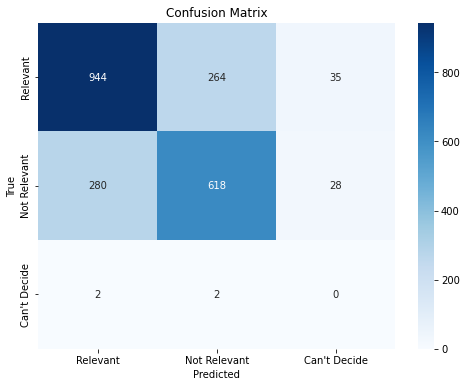

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
tokenizer = Tokenizer(inputCol="text", outputCol="words")

# TF-IDF Vectorization
hashingTF = HashingTF(inputCol="words", outputCol="rawFeatures", numFeatures=1000)
idf = IDF(inputCol="rawFeatures", outputCol="features")

# Encode target labels into numerical indices
label_indexer = StringIndexer(inputCol="choose_one", outputCol="label")

# Define Naive Bayes classifier
nb_classifier = NaiveBayes()

# Define pipeline
pipeline = Pipeline(stages=[tokenizer, hashingTF, idf, label_indexer, nb_classifier])

# Train the model
model = pipeline.fit(train)

# Make predictions
predictions = model.transform(test)

# Infer original labels from DataFrame column
original_labels = [row[0] for row in train.select('choose_one').distinct().collect()]

# Confusion Matrix
conf_matrix = predictions.groupBy("label", "prediction").count().toPandas()
conf_matrix = conf_matrix.pivot(index='label', columns='prediction', values='count').fillna(0)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="g", cmap="Blues", xticklabels=original_labels, yticklabels=original_labels)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Confusion Matrix


In [0]:
train.display()

_c0,_unit_id,_golden,_unit_state,_trusted_judgments,_last_judgment_at,choose_one,choose_one:confidence,choose_one_gold,keyword,location,text,tweetid,userid
0,778255037,False,finalized,5,8/31/2015 4:44,Relevant,0.6018,null,volcano,probably watching survivor,sunset looked like erupting volcano initial thought pixar short lava,6.29e+17,1902458502.0
1,778246229,False,finalized,5,8/29/2015 12:49,Relevant,0.8023,null,body%20bag,null,nikon madhya pradesh digital slr camera body battery carry bag charger,6.29e+17,2895052875.0
2,778253705,False,finalized,5,8/27/2015 15:09,Not Relevant,0.7946,null,smoke,"Winnipeg, MB, Canada",mental twitter note make sure smoke alarm battery snuff time face many twitter reminder changing battery,6.29e+17,218683229.0
3,778249322,False,finalized,6,8/27/2015 15:54,Not Relevant,0.8291,null,emergency,null,emergency need part nashnewvideo nashgrier,6.29e+17,2602666899.0
4,778253583,False,finalized,5,9/1/2015 19:55,Not Relevant,0.7992,null,siren,New York,whelen model siren amplifier police emergency vehicle full read ebay,6.29e+17,3082127333.0
5,778254671,False,finalized,5,8/28/2015 4:34,Not Relevant,0.8,null,trauma,null,today trauma top trauma top trauma richmond know work going crazy next two day,6.29e+17,1553575940.0
6,778253203,False,finalized,6,8/27/2015 16:19,Not Relevant,0.6642,null,ruin,#RedSoxNation,juliechen gonna ruin game vanessa great player,6.29e+17,1349510551.0
7,778247308,False,finalized,5,8/28/2015 3:28,Not Relevant,0.7988,null,collided,null,san antonio star head coach dan hughes carted locker room one guard collided,6.29e+17,205728796.0
8,778245326,False,finalized,5,8/27/2015 16:31,Not Relevant,1.0,null,army,#Capulets #5SOSfam #5quadfam,second summer pick fan army,6.29e+17,2578921998.0
9,778253848,False,finalized,5,9/2/2015 6:44,Not Relevant,1.0,null,stretcher,??,stretcher min speaker deck,6.29e+17,771004074.0


In [0]:
display(test)

_c0,_unit_id,_golden,_unit_state,_trusted_judgments,_last_judgment_at,choose_one,choose_one:confidence,choose_one_gold,keyword,location,text,tweetid,userid
0,778255223,False,finalized,5,8/30/2015 8:00,Not Relevant,0.5951,null,whirlwind,"Harbour Heights, FL",drmartyfox south government libs made evil good good evil reap whirlwind lord mercy,6.29e+17,626461599.0
1,778245596,False,finalized,5,8/29/2015 20:39,Relevant,1.0,null,avalanche,"Denver, CO",senator another year determine hoffman south v coloradoavs nhlavalanche,6.29e+17,3020517836.0
2,778253778,False,finalized,5,9/1/2015 17:40,Not Relevant,0.5954,null,storm,"Sunmy Melbourne, England",want know get edge storm rock paper scissors gamechanger,6.29e+17,210960354.0
3,778250424,False,finalized,5,9/1/2015 16:33,Relevant,0.6078,null,flood,New York,cree led work light bar alloy spot flood combo diving offroad boat full read,6.29e+17,3226116346.0
4,778250795,False,finalized,5,8/31/2015 20:08,Not Relevant,0.603,null,hazard,null,battlefield funny moment duke hazard undercover soldier mav via youtube,6.29e+17,36192325.0
5,778248564,False,finalized,5,8/28/2015 17:00,Not Relevant,0.6018,null,destroyed,USA,black eye space battle occurred star involving fleet totaling ship destroyed,6.29e+17,204155507.0
6,778247012,False,finalized,5,8/29/2015 18:36,Relevant,0.7957,null,catastrophic,Leanbox?,consequence could catastrophic informed security mute primarily,6.29e+17,770326622.0
7,778253379,False,finalized,7,8/27/2015 16:15,Not Relevant,1.0,null,screams,POFFIN,every bts song jimin scream,6.29e+17,3325755886.0
8,778255567,False,finalized,5,8/30/2015 9:06,Relevant,1.0,null,wreckage,null,wreckage conclusively confirmed malaysia pm investigator family,6.29e+17,1210770024.0
9,778249102,False,finalized,5,9/1/2015 16:34,Relevant,0.5994,null,drowning,Liverpool,boy save autistic brother drowning nine year old maine dove pool save autistic brother drowning,6.29e+17,1628313818.0


In [0]:
train

Out[27]: DataFrame[_c0: string, _unit_id: string, _golden: string, _unit_state: string, _trusted_judgments: string, _last_judgment_at: string, choose_one: string, choose_one:confidence: string, choose_one_gold: string, keyword: string, location: string, text: string, tweetid: string, userid: string]

### K-means Clustering
 - We considered 3 clusters for our analysis
 - These cluster centers represent the centroid or center point of each cluster in the feature space. 
 - Each value in the array corresponds to a feature in your dataset.


In [0]:

from pyspark.ml.clustering import KMeans
remover = StopWordsRemover(inputCol="words", outputCol="filtered")


# Define KMeans clustering model
kmeans = KMeans(k=3, seed=1)

# Define pipeline
pipeline = Pipeline(stages=[tokenizer, remover, hashingTF, idf, kmeans])

# Fit the pipeline
model = pipeline.fit(train)

# Make predictions
predictions = model.transform(test)

# Display cluster centers
print("Cluster Centers:")
centers = model.stages[-1].clusterCenters()
for center in centers:
    print(center)

Cluster Centers:
[0.06119049 0.04756779 0.11580687 0.03738659 0.0129948  0.01597121
 0.03185466 0.05577803 0.0240995  0.02316188 0.07997654 0.03424358
 0.03026856 0.02047537 0.04010958 0.04585803 0.02047537 0.03459826
 0.02714743 0.05150883 0.05343514 0.03173454 0.03774296 0.04432932
 0.03744082 0.03027824 0.03239215 0.03658164 0.02245686 0.06554017
 0.0470908  0.03830122 0.02565263 0.03051398 0.05748488 0.05109628
 0.01479776 0.04456088 0.07942211 0.04538077 0.0182583  0.0556173
 0.03495492 0.06092449 0.04236927 0.03014436 0.02473369 0.03365318
 0.04955351 0.02304873 0.02978704 0.01338845 0.05901103 0.04032811
 0.01881873 0.06898565 0.05221184 0.04506689 0.05660812 0.02967268
 0.01468775 0.05613228 0.00786346 0.05240654 0.04079318 0.03305673
 0.03658624 0.01992713 0.0369439  0.04274546 0.03329437 0.02316188
 0.02059137 0.06131083 0.03841821 0.07392056 0.02978704 0.01396579
 0.02221393 0.01479776 0.09708793 0.0165124  0.0182583  0.07573949
 0.02059137 0.03459826 0.03365318 0.04189137 0

#### Visualization of Clusters
- Applied PCA to reduce the dimensionality of your data while retaining most of its variance.
- PCA transforms the original features into a new set of orthogonal components (principal components) that capture the most significant variations in the data.

- After reducing the dimensionality of the data using PCA, we created a scatter plot of the data points in the reduced-dimensional space.
- Each data point is represented by its projection onto the principal components.

- Color-code the data points based on their assigned clusters by K-means.
- This allows us to visually identify clusters and observe their spatial distribution in the reduced-dimensional space.

- Analyzed the spatial distribution of clusters in the PCA space to understand their separation and overlap.
- Overlapping clusters  indicated ambiguity in the clustering or similarity between different groups.

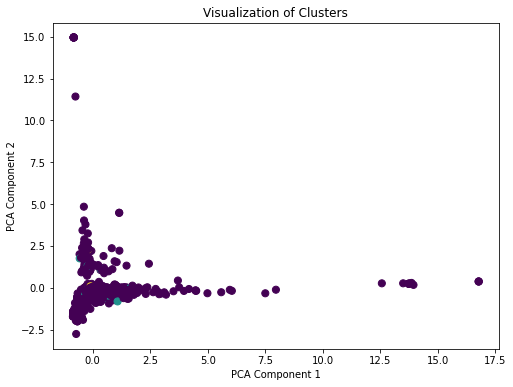

In [0]:
import numpy as np
import matplotlib.pyplot as plt
from pyspark.ml.feature import PCA
from pyspark.sql import Row


# Fit PCA to the features
pca = PCA(k=2, inputCol="features", outputCol="pca_features")
pca_model = pca.fit(predictions)
pca_result = pca_model.transform(predictions).select("pca_features").rdd.map(lambda x: x.pca_features).collect()

# Convert the PCA results to numpy array
pca_array = np.array(pca_result)

# Plot the clusters
plt.figure(figsize=(8, 6))
plt.scatter(pca_array[:, 0], pca_array[:, 1], c=predictions.select("prediction").collect(), cmap='viridis', s=50)
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.title('Visualization of Clusters')
plt.show()

In [0]:
pip install vaderSentiment


Python interpreter will be restarted.
Python interpreter will be restarted.


In [0]:
train = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/dmaddi@gmu.edu/CLEAN_train.csv")
test = spark.read.format("csv").option("header", "true").load("dbfs:/FileStore/shared_uploads/dmaddi@gmu.edu/CLEAN_test.csv")
from pyspark.sql.functions import col


# Drop rows with null values in the text column
train = train.dropna(subset=["text"])

# Convert the text column to string
train = train.withColumn("text", col("text").cast("string"))



#### Sentiment Analysis
- Using sentiment analyser, we executed the code for the text column and found the sentiment of the tweets
- Negative sentiment is more compared to the postive and neutral tweets

In [0]:

from pyspark.sql.functions import udf
from pyspark.sql.types import StringType
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer


# Instantiate the VADER sentiment analyzer
analyzer = SentimentIntensityAnalyzer()

# Define a UDF to perform sentiment analysis on each tweet
def analyze_sentiment(text):
    sentiment_scores = analyzer.polarity_scores(text)
    if sentiment_scores['compound'] >= 0.05:
        return 'Positive'
    elif sentiment_scores['compound'] <= -0.05:
        return 'Negative'
    else:
        return 'Neutral'

# Register the UDF
analyze_sentiment_udf = udf(analyze_sentiment, StringType())

# Apply sentiment analysis UDF to the DataFrame
train = train.withColumn("sentiment", analyze_sentiment_udf("text"))

# Select relevant columns for output
result_df = train.select("text", "sentiment")

# Show the results
result_df.show(truncate=False)




+--------------------------------------------------------------------------------------------------------+---------+
|text                                                                                                    |sentiment|
+--------------------------------------------------------------------------------------------------------+---------+
|sunset looked like erupting volcano initial thought pixar short lava                                    |Positive |
|nikon madhya pradesh digital slr camera body battery carry bag charger                                  |Neutral  |
|mental twitter note make sure smoke alarm battery snuff time face many twitter reminder changing battery|Neutral  |
|emergency need part nashnewvideo nashgrier                                                              |Negative |
|whelen model siren amplifier police emergency vehicle full read ebay                                    |Negative |
|today trauma top trauma top trauma richmond know work going cra

#### Visualizations of the Sentiment Distribution in tweet data

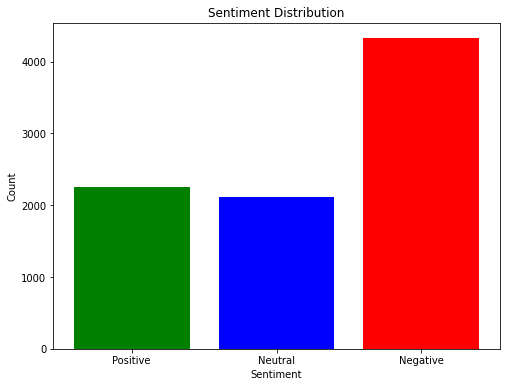

In [0]:
import matplotlib.pyplot as plt

# Count the number of tweets for each sentiment category
sentiment_counts = result_df.groupBy("sentiment").count().collect()

# Extract sentiment categories and counts
sentiments = [row["sentiment"] for row in sentiment_counts]
counts = [row["count"] for row in sentiment_counts]

# Plot the sentiment distribution
plt.figure(figsize=(8, 6))
plt.bar(sentiments, counts, color=['green', 'blue', 'red'])
plt.title("Sentiment Distribution")
plt.xlabel("Sentiment")
plt.ylabel("Count")
plt.show()


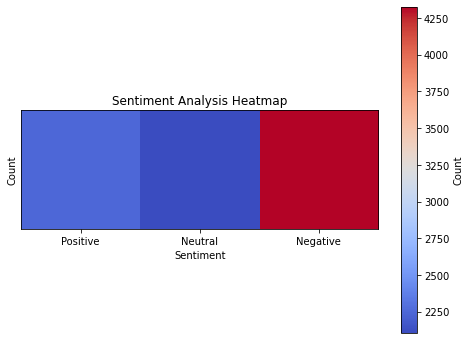

In [0]:
import matplotlib.pyplot as plt
import numpy as np

# Aggregate sentiment counts
sentiment_counts = result_df.groupBy("sentiment").count().collect()

# Extract sentiment categories and counts
sentiments = [row["sentiment"] for row in sentiment_counts]
counts = [row["count"] for row in sentiment_counts]



# Create a matrix for heatmap
matrix = np.array([counts])

# Plot heatmap
plt.figure(figsize=(8, 6))
plt.imshow(matrix, cmap='coolwarm', interpolation='nearest')
plt.xticks(np.arange(len(sentiments)), sentiments)
plt.yticks([])
plt.xlabel('Sentiment')
plt.ylabel('Count')
plt.title('Sentiment Analysis Heatmap')
plt.colorbar(label='Count')
plt.show()


### References
- https://www.datacamp.com/tutorial/what-is-topic-modeling
- https://www.analyticsvidhya.com/blog/2021/06/twitter-sentiment-analysis-a-nlp-use-case-for-beginners/
- https://www.geeksforgeeks.org/k-means-clustering-using-pyspark-python/
- https://ashokpalivela.medium.com/multi-class-text-classification-using-spark-ml-in-python-b8d2a6545cb


